In [1]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras import models
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import plotly.graph_objects as go
import plotly.express as px


In [2]:
DATASET_DIR = './data'
class_names = ['yes', 'no']
image_size = (256, 256)
batch_size = 32

checkpoint_path = "./model_checkpoints/"
checkpoint_name = "model-{epoch:02d}-{val_accuracy:.4f}.h5"
checkpoint_filepath = os.path.join(checkpoint_path, checkpoint_name)

In [3]:
# Create the tf datasets
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR + '/train/',
    labels='inferred', 
    label_mode='binary',  
    class_names=class_names,
    color_mode='rgb',  
    batch_size=batch_size,
    image_size=image_size,
    shuffle=True, 
    seed=123,  
    validation_split=0.2,  # Split dataset into training and validation
    subset='training'  
)


validation_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR + '/train/',
    labels='inferred',
    label_mode='binary',
    class_names=class_names,
    color_mode='rgb',
    batch_size=batch_size,
    image_size=image_size,
    shuffle=True,
    seed=123,
    validation_split=0.2,
    subset='validation'  
)

test_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR + '/test/',
    labels='inferred',
    label_mode='binary',
    class_names=class_names,
    color_mode='rgb',
    image_size=image_size,
    shuffle=False,
    seed=123,
)

Found 222 files belonging to 2 classes.
Using 178 files for training.
Found 222 files belonging to 2 classes.
Using 44 files for validation.
Found 31 files belonging to 2 classes.


In [4]:
data_augmentation = tf.keras.Sequential(
  [
    RandomFlip("horizontal",
                      input_shape=(image_size[0],
                                  image_size[1],
                                  3)),
    RandomRotation(0.1),
    RandomZoom(0.1),
  ]
)

model = models.Sequential([
    data_augmentation,
    Conv2D(32, (3, 3), activation='relu', input_shape=image_size + (3,)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    Flatten(),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

In [27]:
# Define early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  
    patience=20, 
    restore_best_weights=True  
)

checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,  
    monitor='val_accuracy', 
    save_best_only=True,
    save_weights_only=False,
    mode='max',
    verbose=1
)

initial_learning_rate = 0.001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=1000,
    decay_rate=0.96,
    staircase=True)

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule),
              loss='binary_crossentropy', 
              metrics=['accuracy'])


# Display the model summary
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 128)      

In [28]:
num_epochs = 100

history = model.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=num_epochs,  
    callbacks=[early_stopping, checkpoint_callback] 
)

Epoch 1/100
6/6 [==============================] - ETA: 0s - loss: 0.6690 - accuracy: 0.6180
Epoch 1: val_accuracy improved from -inf to 0.70455, saving model to ./model_checkpoints/model-01-0.7045.h5


/Users/armbod/miniforge3/envs/tumour/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



6/6 [==============================] - 9s 1s/step - loss: 0.6690 - accuracy: 0.6180 - val_loss: 0.5963 - val_accuracy: 0.7045
Epoch 2/100
6/6 [==============================] - ETA: 0s - loss: 0.6530 - accuracy: 0.6236
Epoch 2: val_accuracy did not improve from 0.70455
6/6 [==============================] - 7s 1s/step - loss: 0.6530 - accuracy: 0.6236 - val_loss: 0.6527 - val_accuracy: 0.6818
Epoch 3/100
6/6 [==============================] - ETA: 0s - loss: 0.5955 - accuracy: 0.6629
Epoch 3: val_accuracy improved from 0.70455 to 0.77273, saving model to ./model_checkpoints/model-03-0.7727.h5
6/6 [==============================] - 6s 1s/step - loss: 0.5955 - accuracy: 0.6629 - val_loss: 0.7344 - val_accuracy: 0.7727
Epoch 4/100
6/6 [==============================] - ETA: 0s - loss: 0.6551 - accuracy: 0.7135
Epoch 4: val_accuracy did not improve from 0.77273
6/6 [==============================] - 6s 1s/step - loss: 0.6551 - accuracy: 0.7135 - val_loss: 0.5952 - val_accuracy: 0.7727
Epoc

In [29]:
# Create figure
fig = go.Figure().set_subplots(rows=1, cols=2, subplot_titles=('Epoch vs Accuracy',  'Epoch vs Loss'))
num_epochs_trained = len(history.epoch)

# Add training loss/acc trace
fig.add_trace(go.Scatter(x=list(range(1, num_epochs_trained+1)), y=history.history['accuracy'], mode='lines', name='Training Accuracy'), row=1, col=1)
fig.add_trace(go.Scatter(x=list(range(1, num_epochs_trained+1)), y=history.history['loss'], mode='lines', name='Training Loss'), row=1, col=2)

# Add validation loss/acc trace
fig.add_trace(go.Scatter(x=list(range(1, num_epochs_trained+1)), y=history.history['val_accuracy'], mode='lines', name='Validation Accuracy'), row=1, col=1)
fig.add_trace(go.Scatter(x=list(range(1, num_epochs_trained+1)), y=history.history['val_loss'], mode='lines', name='Validation Loss'), row=1, col=2)

# edit axis labels
fig['layout']['xaxis']['title']='Epoch'
fig['layout']['yaxis']['title']='Accuracy'
fig['layout']['xaxis2']['title']='Epoch'
fig['layout']['yaxis2']['title']='Loss'

# Show plot
fig.show()

In [30]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = model.evaluate(test_dataset)

print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

test_labels = []
for t, label in test_dataset:
    batch_test_labels = ([int(x[0]) for x in label.numpy()])
    test_labels += batch_test_labels

# Make predictions on the test dataset
predictions = model.predict(test_dataset)
binary_predictions = [x[0] for x in (predictions > 0.5).astype("int32")]

print("Class predictions for the first few samples:")
print(binary_predictions[:5], test_labels[:5])


1/1 [==============================] - 0s 266ms/step - loss: 0.4051 - accuracy: 0.9032
Test Loss: 0.4051177501678467
Test Accuracy: 0.9032257795333862
1/1 [==============================] - 0s 260ms/step
Class predictions for the first few samples:
[1, 0, 1, 0, 1] [1, 1, 1, 1, 1]


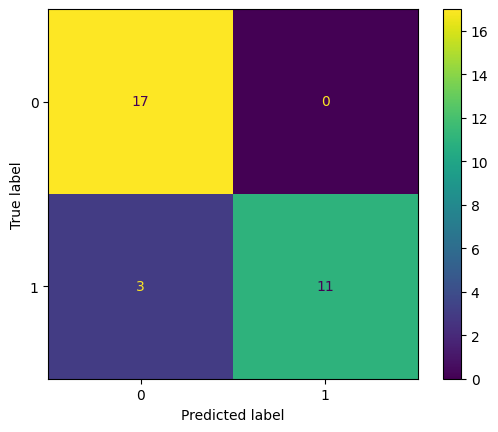

In [31]:
# generate confusion matrix plot
cm =confusion_matrix(test_labels, binary_predictions)

disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()


In [32]:
# Get best checkpoint
checkpoint_files = [f for f in os.listdir(checkpoint_path) if f.endswith('.h5')]

# Sort the checkpoint files based on validation accuracy (assuming the filename convention)
checkpoint_files.sort(key=lambda x: float(x.split('-')[-1][:-3]), reverse=True)

# Get the filename of the checkpoint with the highest validation accuracy
best_checkpoint_file = checkpoint_files[0]

best_checkpoint_path = os.path.join(checkpoint_path, best_checkpoint_file)
model = load_model(best_checkpoint_path)


In [33]:
# Get the convolutional layers
conv_layers = [layer for layer in model.layers if isinstance(layer, tf.keras.layers.Conv2D)]

# Select a batch of images from your dataset for visualization
for images, _ in test_dataset.take(1): 
    for j in range(batch_size)[:5]:
        image = images[j]  
        label = test_dataset.class_names[int(_[j].numpy()[0])]

        # Create a figure for each image
        fig = go.Figure().set_subplots(rows=1, cols=len(conv_layers), horizontal_spacing=0.1)

        for i, layer in enumerate(conv_layers):
            # Create a new model that outputs the features of the current layer
            intermediate_model = models.Model(inputs=model.input, outputs=layer.output)
            
            # Get the features of the current layer for the selected image
            features = intermediate_model.predict(image[tf.newaxis, ...])
            
            # Create a subplot for each feature map in the current layer
            for j in range(features.shape[-1]):
                subplot = go.Heatmap(z=features[0, :, :, j], colorscale='Viridis', showscale=False)
            fig.add_trace(subplot, row=1, col=i+1)
            

        fig.update_layout(title=f'Conv Layers for image label =  {label}',  height=350, width=900)
        fig.show()


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 41ms/step
